**Importing Essential Libraries**

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import joblib

In [2]:
df_yield = pd.read_csv('yield.csv')
df_yield.shape

(56717, 12)

In [3]:
df_yield.head() 

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value
0,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1961,1961,hg/ha,14000
1,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1962,1962,hg/ha,14000
2,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1963,1963,hg/ha,14260
3,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1964,1964,hg/ha,14257
4,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1965,1965,hg/ha,14400


In [4]:
df_yield.tail()

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value
56712,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2012,2012,hg/ha,24420
56713,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2013,2013,hg/ha,22888
56714,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2014,2014,hg/ha,21357
56715,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2015,2015,hg/ha,19826
56716,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2016,2016,hg/ha,18294


In [5]:
#rename column with yield value
df_yield = df_yield.rename(index=str, columns={"Value": "hg/ha_yield"})
df_yield.head()

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,hg/ha_yield
0,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1961,1961,hg/ha,14000
1,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1962,1962,hg/ha,14000
2,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1963,1963,hg/ha,14260
3,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1964,1964,hg/ha,14257
4,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1965,1965,hg/ha,14400


In [6]:
#drop unnecessary columns
df_yield = df_yield.drop(['Year Code','Element Code','Element','Year Code','Area Code','Domain Code','Domain','Unit','Item Code'], axis=1)
df_yield.head()

,Area,Item,Year,hg/ha_yield
0,Afghanistan,Maize,1961,14000
1,Afghanistan,Maize,1962,14000
2,Afghanistan,Maize,1963,14260
3,Afghanistan,Maize,1964,14257
4,Afghanistan,Maize,1965,14400


In [7]:
df_yield.describe() 

,Year,hg/ha_yield
count,56717.000000,56717.000000
mean,1989.669570,62094.660084
std,16.133198,67835.932856
min,1961.000000,0.000000
25%,1976.000000,15680.000000
50%,1991.000000,36744.000000
75%,2004.000000,86213.000000
max,2016.000000,1000000.000000


In [8]:
df_yield.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56717 entries, 0 to 56716
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Area         56717 non-null  object
 1   Item         56717 non-null  object
 2   Year         56717 non-null  int64 
 3   hg/ha_yield  56717 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 2.2+ MB


**Rainfall Data**

In [9]:
df_rain = pd.read_csv('rainfall.csv')
df_rain.head()

,Area,Year,average_rain_fall_mm_per_year
0,Afghanistan,1985,327
1,Afghanistan,1986,327
2,Afghanistan,1987,327
3,Afghanistan,1989,327
4,Afghanistan,1990,327


In [10]:
df_rain = df_rain.rename(index=str, columns={" Area": 'Area'})

In [11]:
df_rain.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6727 entries, 0 to 6726
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Area                           6727 non-null   object
 1   Year                           6727 non-null   int64 
 2   average_rain_fall_mm_per_year  5953 non-null   object
dtypes: int64(1), object(2)
memory usage: 210.2+ KB


**Convert average_rain_fall_mm_per_year to float**

In [12]:
df_rain['average_rain_fall_mm_per_year'] = pd.to_numeric(df_rain['average_rain_fall_mm_per_year'],errors = 'coerce')
df_rain.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6727 entries, 0 to 6726
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           6727 non-null   object 
 1   Year                           6727 non-null   int64  
 2   average_rain_fall_mm_per_year  5947 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 210.2+ KB


In [13]:
df_rain = df_rain.dropna()

In [14]:
df_rain.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5947 entries, 0 to 6726
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           5947 non-null   object 
 1   Year                           5947 non-null   int64  
 2   average_rain_fall_mm_per_year  5947 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 185.8+ KB


In [15]:
df_rain.describe()

,Year,average_rain_fall_mm_per_year
count,5947.000000,5947.000000
mean,2001.365899,1124.743232
std,9.526335,786.257365
min,1985.000000,51.000000
25%,1993.000000,534.000000
50%,2001.000000,1010.000000
75%,2010.000000,1651.000000
max,2017.000000,3240.000000


**Merge Yield Dataframe with Rain Dataframe**

In [16]:
yield_df = pd.merge(df_yield, df_rain, on=['Year','Area'])
yield_df.head()

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year
0,Afghanistan,Maize,1985,16652,327.0
1,Afghanistan,Maize,1986,16875,327.0
2,Afghanistan,Maize,1987,17020,327.0
3,Afghanistan,Maize,1989,16963,327.0
4,Afghanistan,Maize,1990,17582,327.0


In [17]:
yield_df.describe()

,Year,hg/ha_yield,average_rain_fall_mm_per_year
count,25385.000000,25385.000000,25385.000000
mean,2001.278787,68312.278353,1254.849754
std,9.143915,75213.292733,804.449430
min,1985.000000,50.000000,51.000000
25%,1994.000000,17432.000000,630.000000
50%,2001.000000,38750.000000,1150.000000
75%,2009.000000,94286.000000,1761.000000
max,2016.000000,554855.000000,3240.000000


**Importing Pesticides Data**

In [18]:
df_pes = pd.read_csv('pesticides.csv')
df_pes.head()

,Domain,Area,Element,Item,Year,Unit,Value
0,Pesticides Use,Albania,Use,Pesticides (total),1990,tonnes of active ingredients,121.0
1,Pesticides Use,Albania,Use,Pesticides (total),1991,tonnes of active ingredients,121.0
2,Pesticides Use,Albania,Use,Pesticides (total),1992,tonnes of active ingredients,121.0
3,Pesticides Use,Albania,Use,Pesticides (total),1993,tonnes of active ingredients,121.0
4,Pesticides Use,Albania,Use,Pesticides (total),1994,tonnes of active ingredients,201.0


In [19]:
df_pes = df_pes.rename(index=str, columns={"Value": "pest_in_tonnes"})
df_pes = df_pes.drop(['Element','Domain','Unit','Item'], axis=1)
df_pes.head()

,Area,Year,pest_in_tonnes
0,Albania,1990,121.0
1,Albania,1991,121.0
2,Albania,1992,121.0
3,Albania,1993,121.0
4,Albania,1994,201.0


In [20]:
df_pes.describe()

,Year,pest_in_tonnes
count,4349.000000,4.349000e+03
mean,2003.138883,2.030334e+04
std,7.728044,1.177362e+05
min,1990.000000,0.000000e+00
25%,1996.000000,9.300000e+01
50%,2003.000000,1.137560e+03
75%,2010.000000,7.869000e+03
max,2016.000000,1.807000e+06


In [21]:
df_pes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4349 entries, 0 to 4348
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Area            4349 non-null   object 
 1   Year            4349 non-null   int64  
 2   pest_in_tonnes  4349 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 135.9+ KB


**Merge Pesticides DataFrame with Yield DataFrame**

In [22]:
yield_df = pd.merge(yield_df, df_pes, on=['Year', 'Area'])
yield_df.shape

(18949, 6)

In [23]:
yield_df.head()

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pest_in_tonnes
0,Albania,Maize,1990,36613,1485.0,121.0
1,Albania,Maize,1991,29068,1485.0,121.0
2,Albania,Maize,1992,24876,1485.0,121.0
3,Albania,Maize,1993,24185,1485.0,121.0
4,Albania,Maize,1994,25848,1485.0,201.0


**Importing Average Temperature Data**

In [24]:
avg_temp_df = pd.read_csv('temp.csv')
avg_temp_df.head()

,year,country,avg_temp
0,1849,Côte D'Ivoire,25.58
1,1850,Côte D'Ivoire,25.52
2,1851,Côte D'Ivoire,25.67
3,1852,Côte D'Ivoire,NaN
4,1853,Côte D'Ivoire,NaN


In [25]:
avg_temp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71311 entries, 0 to 71310
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   year      71311 non-null  int64  
 1   country   71311 non-null  object 
 2   avg_temp  68764 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.6+ MB


In [26]:
avg_temp_df = avg_temp_df.rename(index=str, columns={"year": "Year", "country":'Area'})
avg_temp_df.head()

,Year,Area,avg_temp
0,1849,Côte D'Ivoire,25.58
1,1850,Côte D'Ivoire,25.52
2,1851,Côte D'Ivoire,25.67
3,1852,Côte D'Ivoire,NaN
4,1853,Côte D'Ivoire,NaN


**Merge Yield DataFrame with Temperature DataFrame**

In [27]:
yield_df = pd.merge(yield_df, avg_temp_df, on=['Area','Year'])
yield_df.head()

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pest_in_tonnes,avg_temp
0,Albania,Maize,1990,36613,1485.0,121.0,16.37
1,Albania,Maize,1991,29068,1485.0,121.0,15.36
2,Albania,Maize,1992,24876,1485.0,121.0,16.06
3,Albania,Maize,1993,24185,1485.0,121.0,16.05
4,Albania,Maize,1994,25848,1485.0,201.0,16.96


In [28]:
yield_df.shape

(28242, 7)

In [29]:
yield_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28242 entries, 0 to 28241
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           28242 non-null  object 
 1   Item                           28242 non-null  object 
 2   Year                           28242 non-null  int64  
 3   hg/ha_yield                    28242 non-null  int64  
 4   average_rain_fall_mm_per_year  28242 non-null  float64
 5   pest_in_tonnes                 28242 non-null  float64
 6   avg_temp                       28242 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 1.5+ MB


In [30]:
yield_df.isnull().sum()

Area                             0
Item                             0
Year                             0
hg/ha_yield                      0
average_rain_fall_mm_per_year    0
pest_in_tonnes                   0
avg_temp                         0
dtype: int64

In [31]:
yield_df.describe()

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pest_in_tonnes,avg_temp
count,28242.000000,28242.000000,28242.00000,28242.000000,28242.000000
mean,2001.544296,77053.332094,1149.05598,37076.909344,20.542627
std,7.051905,84956.612897,709.81215,59958.784665,6.312051
min,1990.000000,50.000000,51.00000,0.040000,1.300000
25%,1995.000000,19919.250000,593.00000,1702.000000,16.702500
50%,2001.000000,38295.000000,1083.00000,17529.440000,21.510000
75%,2008.000000,104676.750000,1668.00000,48687.880000,26.000000
max,2013.000000,501412.000000,3240.00000,367778.000000,30.650000


In [32]:
yield_df.duplicated().sum()

np.int64(2310)

In [33]:
yield_df.drop_duplicates(inplace=True)

In [34]:
yield_df.duplicated().sum()

np.int64(0)

In [35]:
def isStr(obj):
    try:
        float(obj)
        return False
    except:
        return True
to_drop = yield_df[yield_df['average_rain_fall_mm_per_year'].apply(isStr)].index

In [36]:
yield_df = yield_df.drop(to_drop)

In [37]:
yield_df['average_rain_fall_mm_per_year'] = yield_df['average_rain_fall_mm_per_year'].astype(np.float64)

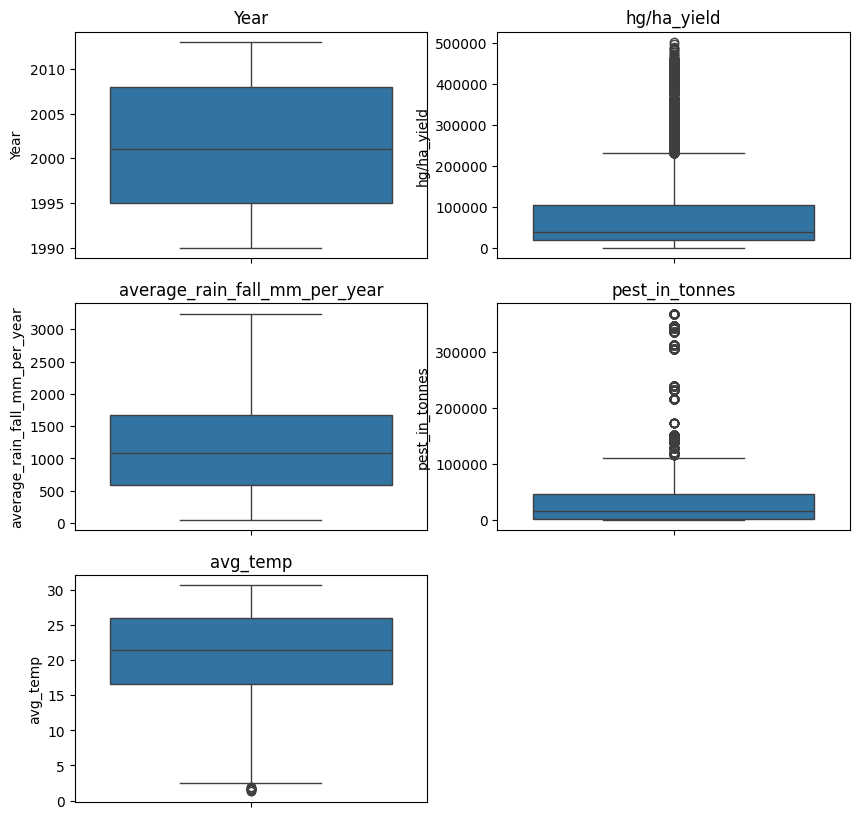

In [38]:
# Checking the data for outliers

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize = (10,10))

plt.subplot(3,2,1)
sns.boxplot(data= yield_df['Year'])
plt.title('Year')


plt.subplot(3,2,2)
sns.boxplot(data= yield_df['hg/ha_yield'])
plt.title('hg/ha_yield')

plt.subplot(3,2,3)
sns.boxplot(data= yield_df['average_rain_fall_mm_per_year'])
plt.title('average_rain_fall_mm_per_year')

plt.subplot(3,2,4)
sns.boxplot(data= yield_df['pest_in_tonnes'])
plt.title('pest_in_tonnes')

plt.subplot(3,2,5)
sns.boxplot(data= yield_df['avg_temp'])
plt.title('avg_temp')

plt.show()

We see that there are certain outliers in the avg_temp and pest_in_tonnes columns. We will try to remove it


<Axes: xlabel='pest_in_tonnes', ylabel='Count'>

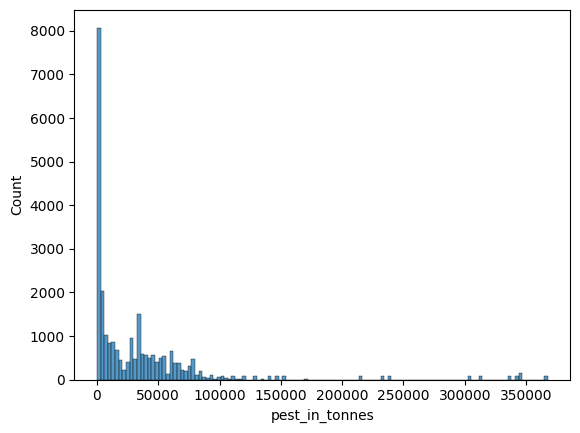

In [39]:
### Checking the pesticide usage data

## Checking the data distribution in the yield column
sns.histplot(yield_df, x = 'pest_in_tonnes' )

There are outlier points in the datsets and hence dropping only the upper 10% data points to prevent high variance.

In [40]:
yield_df = yield_df[yield_df['pest_in_tonnes'] <= yield_df['pest_in_tonnes'].quantile(0.90)]

<Axes: xlabel='pest_in_tonnes', ylabel='Count'>

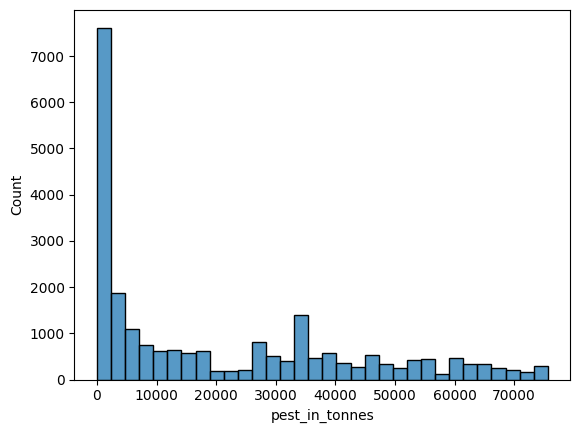

In [41]:
### Checking the pesticide usage data

## Checking the data distribution in the yield column
sns.histplot(yield_df, x = 'pest_in_tonnes' )

In [42]:
col = ['Year', 'average_rain_fall_mm_per_year','pest_in_tonnes', 'avg_temp', 'Area', 'Item', 'hg/ha_yield']
yield_df = yield_df[col]
X = yield_df.iloc[:, :-1]
y = yield_df.iloc[:, -1]
print(X)
print(y)

       Year  average_rain_fall_mm_per_year  pest_in_tonnes  avg_temp  \
0      1990                         1485.0          121.00     16.37   
1      1991                         1485.0          121.00     15.36   
2      1992                         1485.0          121.00     16.06   
3      1993                         1485.0          121.00     16.05   
4      1994                         1485.0          201.00     16.96   
...     ...                            ...             ...       ...   
28237  2009                          657.0         3269.99     20.52   
28238  2010                          657.0         3305.17     21.17   
28239  2011                          657.0         3340.35     20.78   
28240  2012                          657.0         3375.53     20.52   
28241  2013                          657.0         2550.07     19.76   

           Area   Item  
0       Albania  Maize  
1       Albania  Maize  
2       Albania  Maize  
3       Albania  Maize  
4       Al

In [43]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
ohe = OneHotEncoder(drop='first')
scale = StandardScaler()

preprocesser = ColumnTransformer(
        transformers = [
            ('StandardScaler', scale, [0, 1, 2, 3]),
            ('OHE', ohe, [4, 5]),
        ],
        remainder='passthrough'
)


datacorr = yield_df.copy()
# from sklearn.preprocessing import OneHotEncoder
# categorical_columns = datacorr.select_dtypes(include=['object']).columns.tolist()

# # Initialize OneHotEncoder
# ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# # Fit on training data
# encoded_cats = ohe.fit_transform(datacorr[categorical_columns])

# # Convert to DataFrame
# encoded_cat_df = pd.DataFrame(encoded_cats, columns=ohe.get_feature_names_out(categorical_columns))

# # Drop original categorical columns and concatenate encoded columns
# datacorr = datacorr.drop(columns=categorical_columns).reset_index(drop=True)
# datacorr = pd.concat([datacorr, encoded_cat_df], axis=1)

# print(datacorr.head())  # Check tra1nsformed data

In [44]:
crop_counts = yield_df.groupby('Item').count()['Area']
crop_counts

Item
Cassava                 1689
Maize                   3507
Plantains and others     542
Potatoes                3639
Rice, paddy             2780
Sorghum                 2518
Soybeans                2623
Sweet potatoes          2318
Wheat                   3222
Yams                     531
Name: Area, dtype: int64

Text(0.5, 1.0, 'Heatmap')

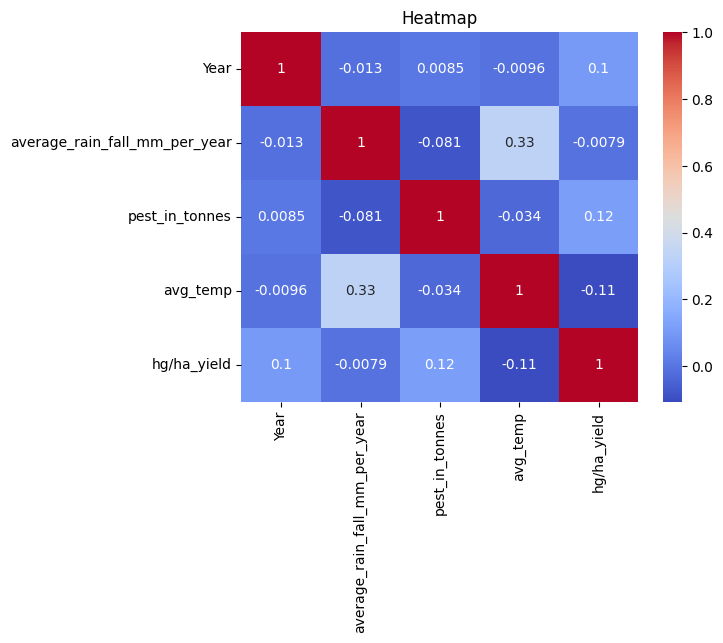

In [45]:
num_cor = yield_df.select_dtypes(['int64','float64']).corr()
sns.heatmap(num_cor,cmap = 'coolwarm', annot = True)
plt.title('Heatmap')

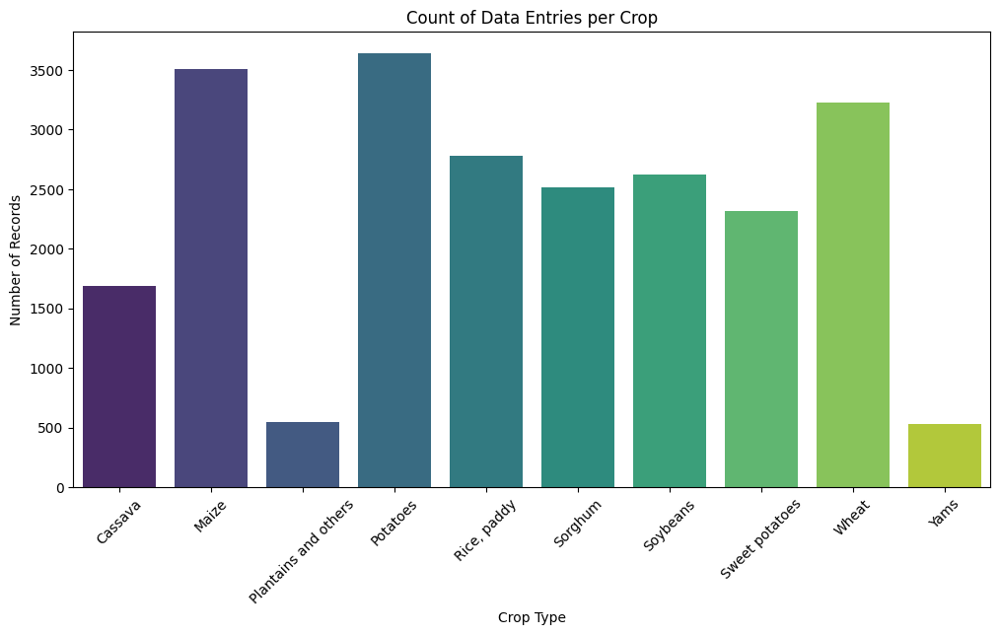

In [46]:
plt.figure(figsize=(12, 6))
sns.barplot(x=crop_counts.index, y=crop_counts.values, hue=crop_counts.index, palette="viridis", legend=False)

plt.xlabel("Crop Type")
plt.ylabel("Number of Records")
plt.title("Count of Data Entries per Crop")
plt.xticks(rotation=45)
plt.show()

In [47]:
yield_df['Area'].nunique()

101

In [48]:
print(yield_df.columns)

Index(['Year', 'average_rain_fall_mm_per_year', 'pest_in_tonnes', 'avg_temp',
       'Area', 'Item', 'hg/ha_yield'],
      dtype='object')


**Top 15 countries**

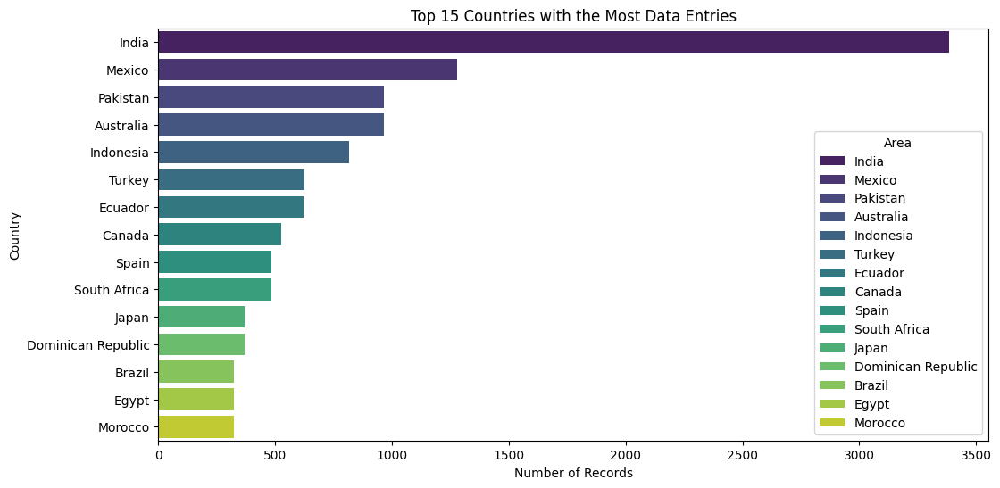

In [49]:
# Count occurrences of each country
country_counts = yield_df['Area'].value_counts()

# Select top N countries (e.g., top 15)
top_n = 15
top_countries = country_counts.head(top_n)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(y=top_countries.index, x=top_countries.values, hue=top_countries.index, palette="viridis", legend=True)

plt.xlabel("Number of Records")
plt.ylabel("Country")
plt.title(f"Top {top_n} Countries with the Most Data Entries")
plt.show()


In [50]:
# #Horizontal plot for better readability
# plt.figure(figsize=(12, 20))  # Increase height for readability
# sns.barplot(y=country_counts.index, x=country_counts.values, hue=country_counts.index, palette="coolwarm", legend=False)

# plt.xlabel("Number of Records")
# plt.ylabel("Country")
# plt.title("Data Distribution Across Countries")
# plt.show()

**Crop Yield per country(Top 15)**

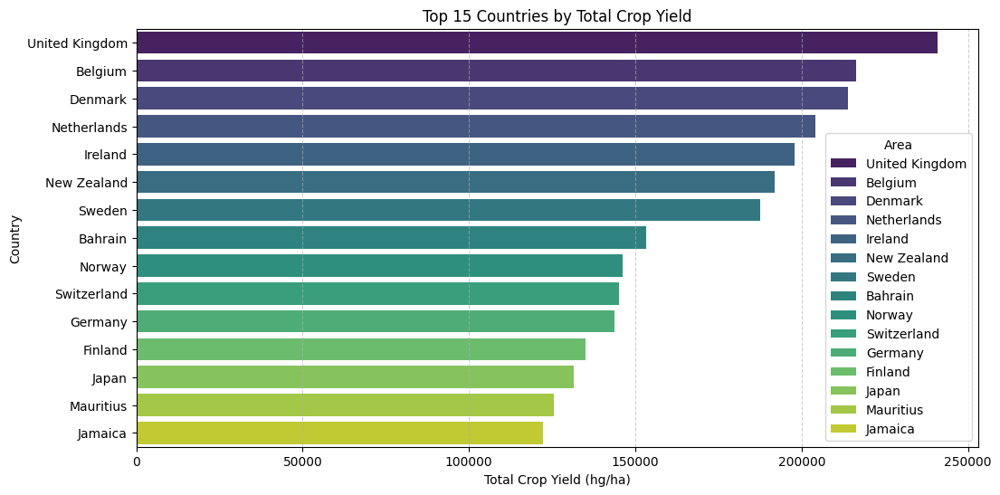

In [51]:
# Aggregate total crop yield per country
country_yield = yield_df.groupby("Area")["hg/ha_yield"].mean().sort_values(ascending=False).head(15)

# Plot the bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=country_yield.values, y=country_yield.index, hue=country_yield.index, palette="viridis", legend=True)

# Customize the plot
plt.xlabel("Total Crop Yield (hg/ha)")
plt.ylabel("Country")
plt.title("Top 15 Countries by Total Crop Yield")
plt.grid(axis="x", linestyle="--", alpha=0.6)

# Show the plot
plt.show()

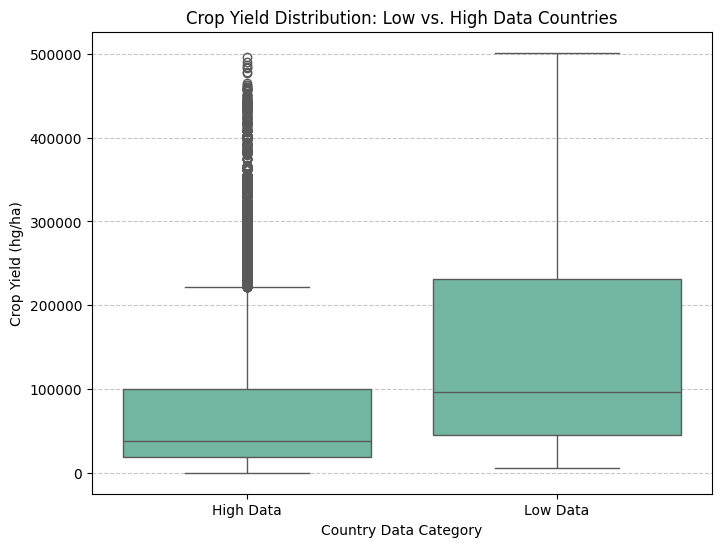

In [52]:
# Create a column to classify countries into "Low Data" vs. "High Data"
threshold = 50  # Adjust as needed
yield_df['Data Category'] = yield_df['Area'].map(lambda x: 'Low Data' if country_counts[x] <= threshold else 'High Data')

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=yield_df, x='Data Category', y='hg/ha_yield', hue='Data Category'.index, palette='Set2', legend=False)

plt.xlabel("Country Data Category")
plt.ylabel("Crop Yield (hg/ha)")
plt.title("Crop Yield Distribution: Low vs. High Data Countries")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


**Crop Yield Over Time**

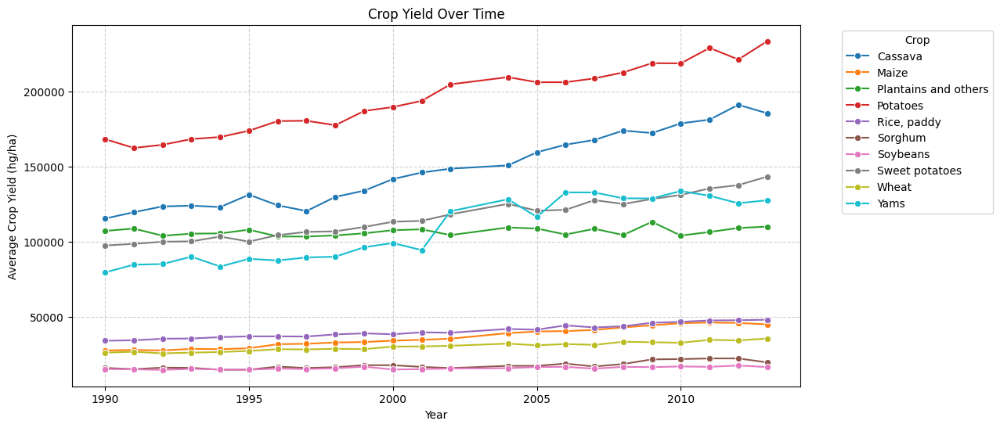

In [53]:
# Group by Year and Crop, then calculate the mean yield
avg_yield_per_crop_year = yield_df.groupby(['Year', 'Item'])['hg/ha_yield'].mean().reset_index()

# Line Chart
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_yield_per_crop_year, x='Year', y='hg/ha_yield', hue='Item', marker='o', palette='tab10')

plt.xlabel("Year")
plt.ylabel("Average Crop Yield (hg/ha)")
plt.title("Crop Yield Over Time")
plt.legend(title="Crop", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


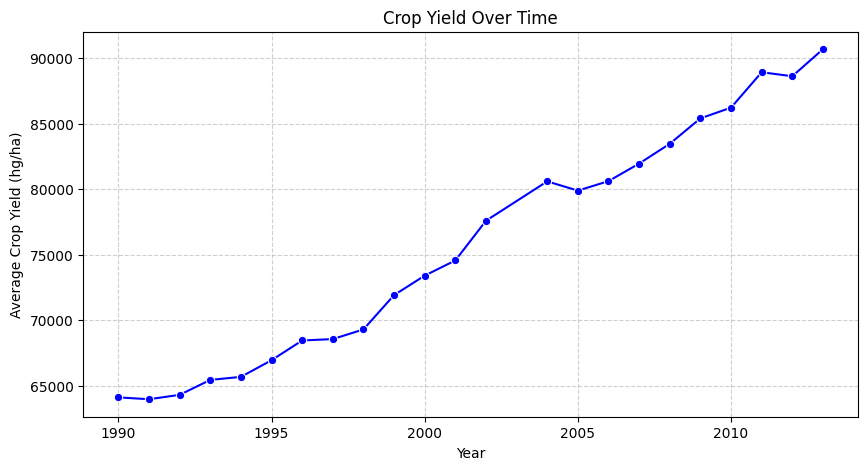

In [54]:
# Group by Year and calculate the mean yield across all crops
avg_yield_per_year = yield_df.groupby('Year')['hg/ha_yield'].mean().reset_index()

# Line Chart
plt.figure(figsize=(10, 5))
sns.lineplot(data=avg_yield_per_year, x='Year', y='hg/ha_yield', marker='o', color='b')

plt.xlabel("Year")
plt.ylabel("Average Crop Yield (hg/ha)")
plt.title("Crop Yield Over Time")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


**Crop Yield vs Crop Type**

This visualization will compare average crop yields across different crop types.

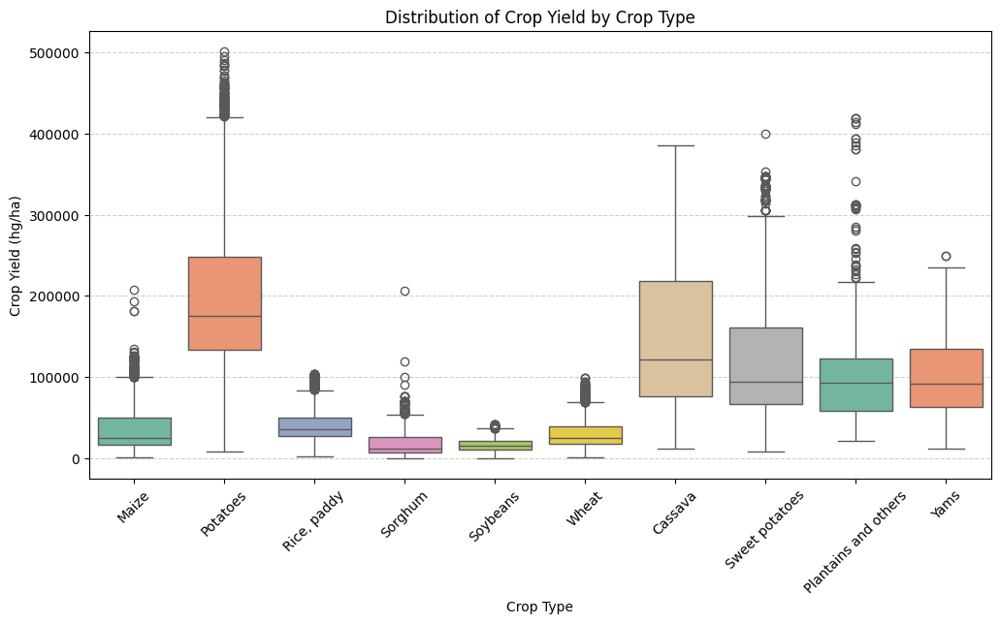

In [55]:

# Box Plot
plt.figure(figsize=(12, 6))
sns.boxplot(data=yield_df, x='Item', y='hg/ha_yield', hue='Item', palette='Set2', legend=False)

plt.xlabel("Crop Type")
plt.ylabel("Crop Yield (hg/ha)")
plt.title("Distribution of Crop Yield by Crop Type")
plt.xticks(rotation=45)  # Rotate labels for readability
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()


In [56]:
yield_df.head()

,Year,average_rain_fall_mm_per_year,pest_in_tonnes,avg_temp,Area,Item,hg/ha_yield,Data Category
0,1990,1485.0,121.0,16.37,Albania,Maize,36613,High Data
1,1991,1485.0,121.0,15.36,Albania,Maize,29068,High Data
2,1992,1485.0,121.0,16.06,Albania,Maize,24876,High Data
3,1993,1485.0,121.0,16.05,Albania,Maize,24185,High Data
4,1994,1485.0,201.0,16.96,Albania,Maize,25848,High Data


In [57]:
import pandas as pd
import plotly.express as px

# Aggregate yield by country (mean yield per country)
country_yield = yield_df.groupby("Area")["hg/ha_yield"].mean().reset_index()

# Plot Choropleth Map
fig = px.choropleth(
    country_yield, 
    locations="Area",  
    locationmode="country names",  # Ensure country names match Plotly's dataset
    color="hg/ha_yield",  
    color_continuous_scale="Viridis",  
    title="Crop Yield Variation Across Countries",
    labels={"hg/ha_yield": "Avg Yield (hg/ha)"},
)

# Increase figure size
fig.update_layout(
    autosize=False,
    width=1100,
    height=500,
)

fig.show()


In [58]:
country = (yield_df['Area'].unique())
# Create a dictionary to store country-wise yield
yield_per_country = {}

for each in country:
    total_yield = yield_df[yield_df['Area'] == each]['hg/ha_yield'].mean()
    yield_per_country[each] = total_yield  # Store country and yield in dictionary

# Convert to DataFrame for better readability
yield_df_per_country = pd.DataFrame(list(yield_per_country.items()), columns=['Country', 'Total Yield'])

# Display the DataFrame
yield_df_per_country

,Country,Total Yield
0,Albania,57692.282828
1,Algeria,58872.491228
2,Angola,34893.676829
3,Argentina,86964.984375
4,Armenia,71811.111111
...,...,...
96,Ukraine,41017.990741
97,United Kingdom,240956.478261
98,Uruguay,59253.540373
99,Zambia,39425.603261


In [59]:
import pandas as pd
import plotly.express as px

# Scatter plot with regression line
fig = px.scatter(
    yield_df, 
    x="average_rain_fall_mm_per_year", 
    y="hg/ha_yield", 
    trendline="ols",  # Ordinary Least Squares regression line
    title="Rainfall vs Crop Yield",
    labels={
        "average_rain_fall_mm_per_year": "Average Rainfall (mm/year)",
        "hg/ha_yield": "Crop Yield (hg/ha)"
    },
    opacity=0.6
)

fig.show()


**Pesticide Usage vs Yield**

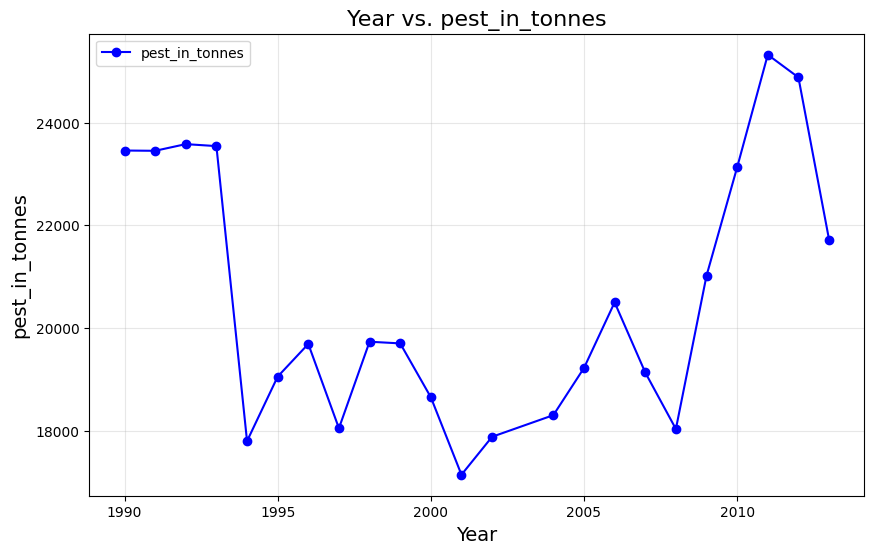

In [60]:
grouped_df = yield_df.groupby('Year', as_index=False)['pest_in_tonnes'].mean()

plt.figure(figsize=(10, 6))
plt.plot(grouped_df['Year'], grouped_df['pest_in_tonnes'], marker='o', linestyle='-', color='blue', label='pest_in_tonnes')

plt.xlabel('Year', fontsize=14)
plt.ylabel('pest_in_tonnes', fontsize=14)
plt.title('Year vs. pest_in_tonnes', fontsize=16)

plt.legend()
plt.grid(alpha=0.3)
plt.show()

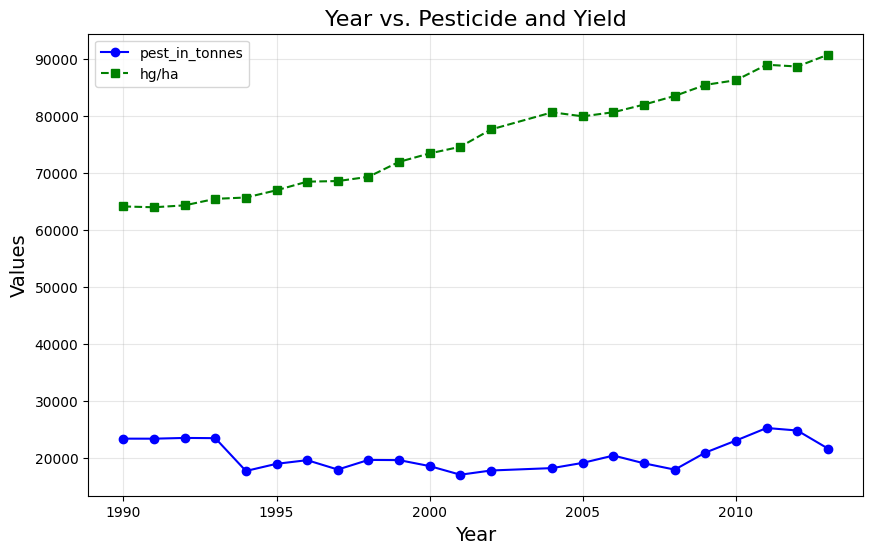

In [61]:
grouped_df = yield_df.groupby('Year', as_index=False).agg({'pest_in_tonnes': 'mean', 'hg/ha_yield': 'mean'})

plt.figure(figsize=(10, 6))

plt.plot(grouped_df['Year'], grouped_df['pest_in_tonnes'], marker='o', linestyle='-', color='blue', label='pest_in_tonnes')

plt.plot(grouped_df['Year'], grouped_df['hg/ha_yield'], marker='s', linestyle='--', color='green', label='hg/ha')

plt.xlabel('Year', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.title('Year vs. Pesticide and Yield', fontsize=16)

plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [62]:
print(yield_df.columns)

Index(['Year', 'average_rain_fall_mm_per_year', 'pest_in_tonnes', 'avg_temp',
       'Area', 'Item', 'hg/ha_yield', 'Data Category'],
      dtype='object')


**Average Temperature Distribution**

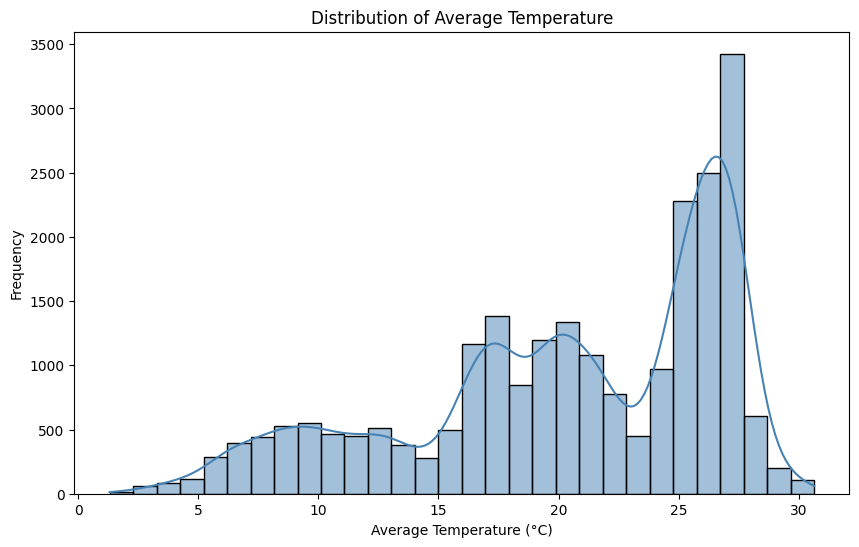

In [63]:
plt.figure(figsize=(10, 6))
sns.histplot(yield_df["avg_temp"], bins=30, kde=True, color="steelblue")
plt.xlabel("Average Temperature (°C)")
plt.ylabel("Frequency")
plt.title("Distribution of Average Temperature")
plt.show()


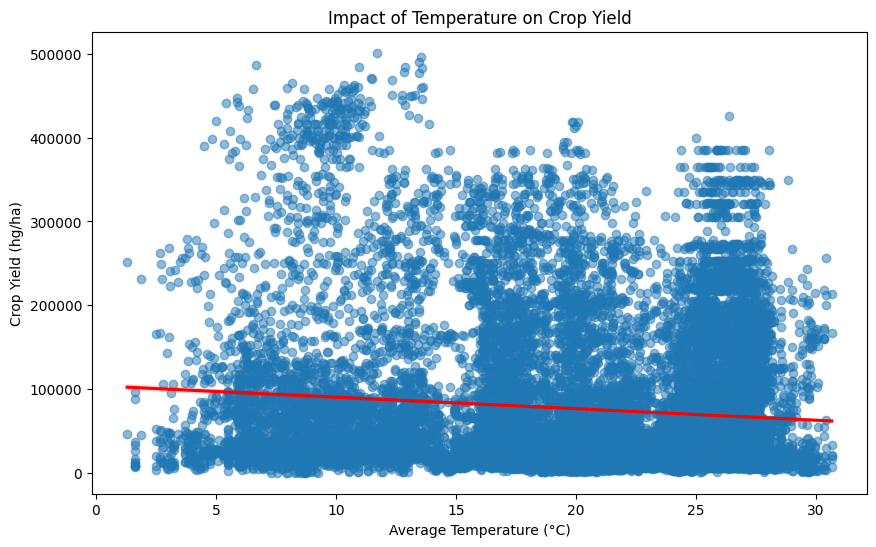

In [64]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x=yield_df["avg_temp"], 
    y=yield_df["hg/ha_yield"], 
    scatter_kws={"alpha": 0.5}, 
    line_kws={"color": "red"}
)
plt.xlabel("Average Temperature (°C)")
plt.ylabel("Crop Yield (hg/ha)")
plt.title("Impact of Temperature on Crop Yield")
plt.show()


The scatter plot shows the relationship between average temperature (°C) and crop yield (hg/ha). The red regression line indicates a weak negative correlation, suggesting that higher temperatures may slightly reduce crop yield. However, the wide spread of data points implies high variability, meaning temperature alone is not a strong predictor of yield. Other factors like soil nutrients, rainfall, and crop type likely influence yield more significantly.

In [65]:
import ipywidgets as widgets
from IPython.display import display

# Create dropdowns
area_dropdown = widgets.Dropdown(options=yield_df['Area'].unique(), description='Area:')
item_dropdown = widgets.Dropdown(options=yield_df['Item'].unique(), description='Item:')

def plot_data(area, item):
    plt.figure(figsize=(10,6))
    temp_df = yield_df[(yield_df['Area'] == area) & (yield_df['Item'] == item)]
    plt.plot(temp_df['Year'], temp_df['hg/ha_yield'])
    plt.title(f'hg/ha_yield over the years for {item} in {area}')
    plt.xlabel('Year')
    plt.ylabel('hg/ha_yield')
    plt.grid(True)
    plt.show()

widgets.interactive(plot_data, area=area_dropdown, item=item_dropdown)

interactive(children=(Dropdown(description='Area:', options=('Albania', 'Algeria', 'Angola', 'Argentina', 'Arm…

Model Training and Evaluation

In [66]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)
X_train_dummy = preprocesser.fit_transform(X_train)
X_test_dummy = preprocesser.transform(X_test)
joblib.dump(preprocesser,"preprocessor.pkl")

['preprocessor.pkl']

In [67]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error

import joblib
from sklearn.tree import DecisionTreeRegressor

In [76]:


def adjusted_r2_score(y_train, y_pred):
    n = X_test.shape[0]
    p = X_test.shape[1]
    r2 = r2_score(y_train, y_pred)
    return 1 - ((1 - r2) * (n - 1) / (n - p - 1))

The accuracy of the LinearRegresssion Model Train is 74.13
The accuracy of the  LinearRegresssion Model Test is 74.53
Model LinearRegresssion saved as LinearRegresssion_model.pkl


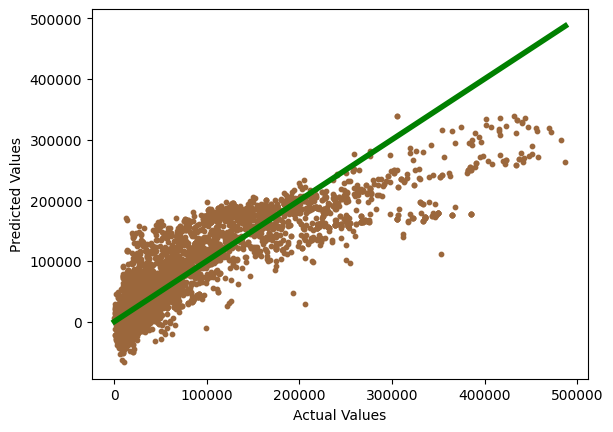

The accuracy of the DecisionTree Model Train is 91.73
The accuracy of the  DecisionTree Model Test is 91.66
Model DecisionTree saved as DecisionTree_model.pkl


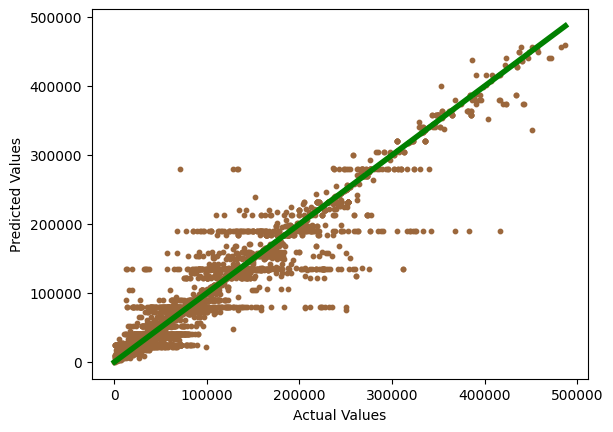

The accuracy of the RandomForest Model Train is 93.08
The accuracy of the  RandomForest Model Test is 92.71
Model RandomForest saved as RandomForest_model.pkl


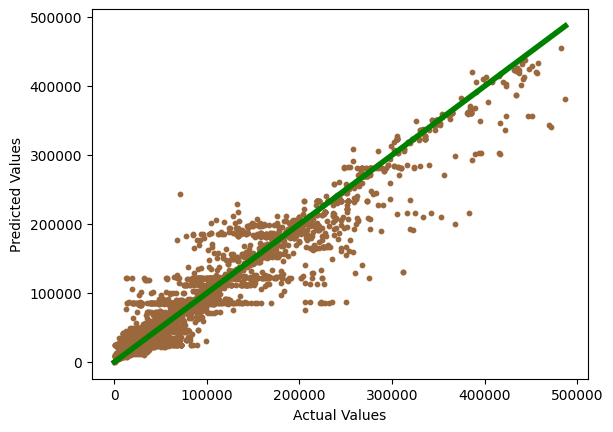

The accuracy of the XGBoost Model Train is 97.58
The accuracy of the  XGBoost Model Test is 96.71
Model XGBoost saved as XGBoost_model.pkl


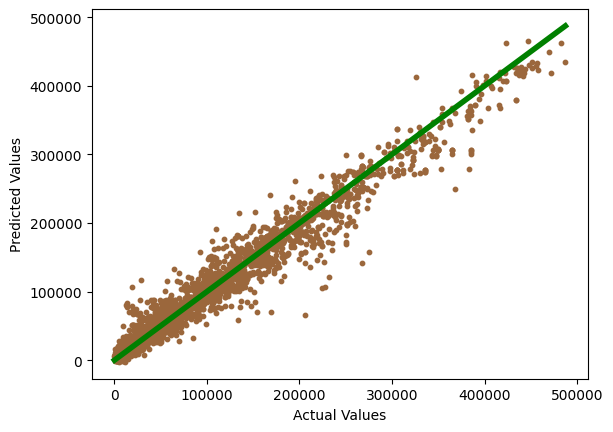

,Model,Accuracy,MSE,adjusted_R2_score
0,LinearRegresssion,0.745344,1898694199.976115,0.745017
1,DecisionTree,0.916647,621473171.421306,0.916540
2,RandomForest,0.927128,543330796.120654,0.927034
3,XGBoost,0.967072,245506615.345787,0.967030


In [78]:
results = []
models = [
    ('LinearRegresssion', LinearRegression()),
    ('DecisionTree', DecisionTreeRegressor(max_depth=10,random_state=42)),
    ('RandomForest', RandomForestRegressor(max_depth=10,random_state=42)),
    ('XGBoost', XGBRegressor(random_state=42))
]

for name, model in models:
    model.fit(X_train_dummy, y_train)
    y_pred = model.predict(X_test_dummy)
    accuracy = model.score(X_test_dummy, y_test)
    MSE = mean_squared_error(y_test, y_pred)
    adjusted_R2_score = adjusted_r2_score(y_test,y_pred)
    results.append((name,accuracy,MSE,adjusted_R2_score))
    acc = (model.score(X_train_dummy,y_train))*100
    print(f'The accuracy of the {name} Model Train is {acc:.2f}')
    acc =(model.score(X_test_dummy , y_test)*100)
    print(f'The accuracy of the  {name} Model Test is {acc:.2f}')  
    #saving the trained mmodel
    joblib.dump(model, f"{name}_model.pkl")
    print(f"Model {name} saved as {name}_model.pkl")
    plt.scatter(y_test, y_pred,s=10,color='#9B673C')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    #plt.title(f' {name} Evaluation')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='green', linewidth = 4)
    plt.show()



dff = pd.DataFrame(results, columns=['Model', 'Accuracy', 'MSE', 'adjusted_R2_score'])
df_styled_best = dff.style.highlight_max(subset=['Accuracy','adjusted_R2_score'], color='green').highlight_min(subset=['MSE'], color='green').highlight_max(subset=['MSE'], color='red').highlight_min(subset=['Accuracy','adjusted_R2_score'], color='red')

# df_styled_worst = dff.style.highlight_max(subset=['MSE'], color='red').highlight_min(subset=['Accuracy','R2_score'], color='red')

display(df_styled_best)
# display(df_styled_worst)

Hybrid Model

In [79]:
#Taking DT, RF and XGBoost for hybrid ml model
dt_model = joblib.load("DecisionTree_model.pkl")
rf_model = joblib.load("RandomForest_model.pkl")
xgb_model = joblib.load("XGBoost_model.pkl")

In [80]:
y_pred_dt = dt_model.predict(X_test_dummy)
y_pred_rf = rf_model.predict(X_test_dummy)
y_pred_xgb = xgb_model.predict(X_test_dummy)

In [81]:
# # Calculate MSE for each model
# mse_dt = mean_squared_error(y_test, y_pred_dt)
# mse_rf = mean_squared_error(y_test, y_pred_rf)
# mse_xgb = mean_squared_error(y_test, y_pred_xgb)

# # Assign weights (inverse of MSE)
# w1 = 1 / mse_dt
# w2 = 1 / mse_rf
# w3 = 1 / mse_xgb

# # Normalize weights
# w_total = w1 + w2 + w3
# w1, w2, w3 = w1 / w_total, w2 / w_total, w3 / w_total

# # Compute hybrid prediction
# hybrid_pred = (w1 * y_pred_dt + w2 * y_pred_rf + w3 * y_pred_xgb)

from sklearn.ensemble import StackingRegressor
base_models = [
    # ('lr', LinearRegression()),  # Score: 0.748657
    ('dt', DecisionTreeRegressor(max_depth=10, random_state=42)),  # Score: 0.9091111
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),  # Score: 0.922098
]

# Define meta-model (XGBoost because it has the highest score)
meta_model = XGBRegressor(n_estimators=100, random_state=42)

# Create Stacking Regressor
stacking_model = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Train the stacking model
stacking_model.fit(X_train_dummy, y_train)

#Saving the hybrid model
joblib.dump(stacking_model,"Hybrid_model.pkl")
print("Model saved successfully")
# Make predictions
y_pred_hybrid = stacking_model.predict(X_test_dummy)

Model saved successfully


Hybrid Model MSE: 132982765.5559
Hybrid Model R² Score: 0.9821


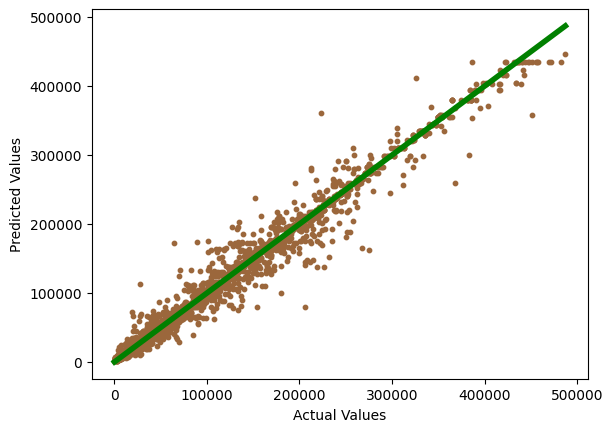

In [82]:
mse = mean_squared_error(y_test,y_pred_hybrid)
r2 = adjusted_r2_score(y_test, y_pred_hybrid)

print(f"Hybrid Model MSE: {mse:.4f}")
print(f"Hybrid Model R² Score: {r2:.4f}")

plt.scatter(y_test, y_pred_hybrid,s=10,color='#9B673C')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
#plt.title(f' {name} Evaluation')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='green', linewidth = 4)
plt.show()